In [1]:
!pip install keras-tuner --upgrade
!pip install tensorflow

In [2]:
# Importing libraries 
import matplotlib.pyplot as plt 
import numpy as np
import pandas as pd
import os 
import PIL 
import tensorflow as tf 
import glob
from pathlib import Path
import keras_tuner as kt
import random
import seaborn as sns
from PIL import Image
from typing import Dict, List
from keras.models import load_model
  
from tensorflow import keras
from tensorflow.keras import layers 
from tensorflow.keras.models import Sequential 

In [3]:
import warnings
warnings.filterwarnings('ignore') #ignore warnings

In [4]:
# import data and seperate into training and validation directories
data_dir = "..\\Project 4 Resources\\New Plant Diseases Dataset(Augmented)"
train_dir = Path(os.path.join(data_dir, "train"))
valid_dir = Path(os.path.join(data_dir, "valid"))
diseases = os.listdir(train_dir) #get labels(folder names)
jpg_train_files = list(Path(train_dir).rglob('*/*.jpg'))
print(f"Number of training files: {len(jpg_train_files)}") #70295

Number of training files: 70295


In [5]:
# list labels
diseases

['Apple___Apple_scab',
 'Apple___Black_rot',
 'Apple___Cedar_apple_rust',
 'Apple___healthy',
 'Blueberry___healthy',
 'Cherry_(including_sour)___healthy',
 'Cherry_(including_sour)___Powdery_mildew',
 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot',
 'Corn_(maize)___Common_rust_',
 'Corn_(maize)___healthy',
 'Corn_(maize)___Northern_Leaf_Blight',
 'Grape___Black_rot',
 'Grape___Esca_(Black_Measles)',
 'Grape___healthy',
 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)',
 'Orange___Haunglongbing_(Citrus_greening)',
 'Peach___Bacterial_spot',
 'Peach___healthy',
 'Pepper,_bell___Bacterial_spot',
 'Pepper,_bell___healthy',
 'Potato___Early_blight',
 'Potato___healthy',
 'Potato___Late_blight',
 'Raspberry___healthy',
 'Soybean___healthy',
 'Squash___Powdery_mildew',
 'Strawberry___healthy',
 'Strawberry___Leaf_scorch',
 'Tomato___Bacterial_spot',
 'Tomato___Early_blight',
 'Tomato___healthy',
 'Tomato___Late_blight',
 'Tomato___Leaf_Mold',
 'Tomato___Septoria_leaf_spot',
 'Tomato___Spid

In [6]:
# set batch size & image sizes
batch_size = 32
img_height = 256
img_width = 256

In [7]:
# get training images dataset
train_ds = tf.keras.utils.image_dataset_from_directory(
  train_dir,
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 70295 files belonging to 38 classes.


In [8]:
# get validation images dataset
val_ds = tf.keras.utils.image_dataset_from_directory(
  valid_dir,
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 17572 files belonging to 38 classes.


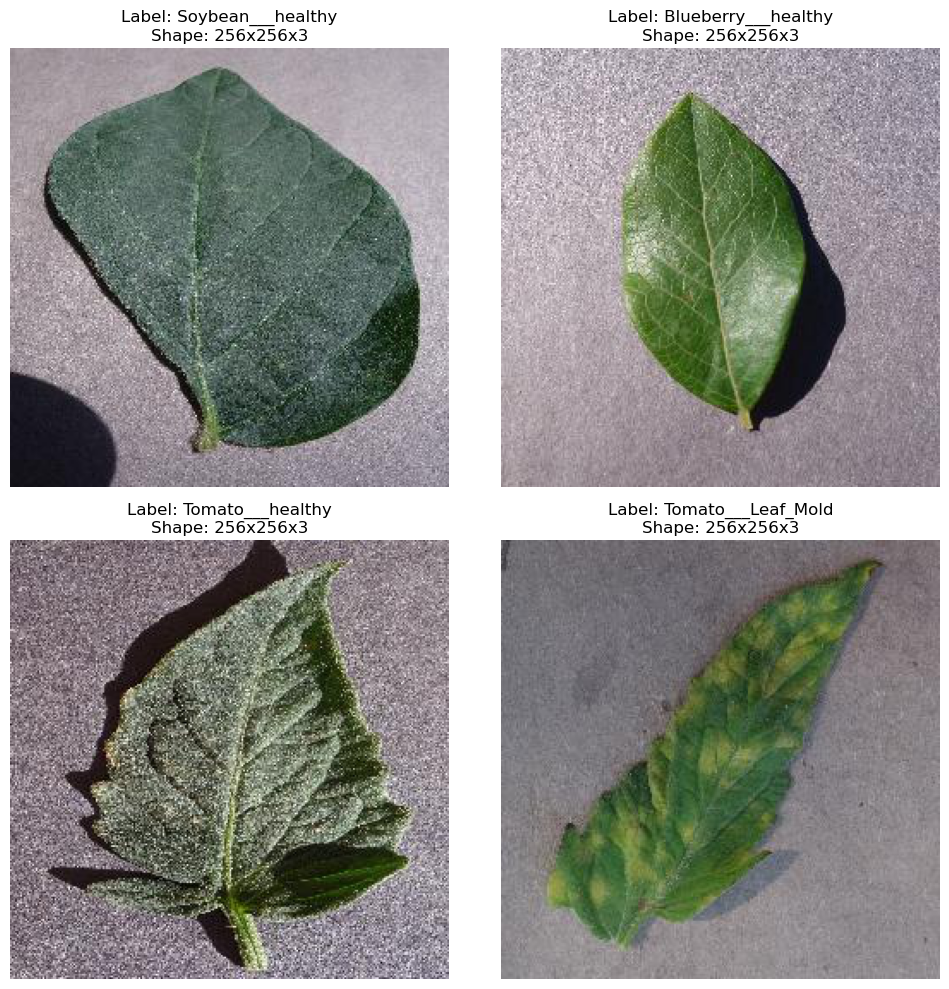

In [9]:
# Test display 4 RANDOM images
random.seed(47) # change the seed for new images
# choose 4 training images' paths randomly
image_path_list = list(Path(train_dir).rglob('*/*.jpg'))
random_image_paths = random.sample(image_path_list, 4)

# define the subplot
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 10))

# display the images randomly
for i, ax in enumerate(axes.flat):
    random_image_path = random_image_paths[i] # get image path
    image_class = random_image_path.parent.stem # get image class from path name as label
    image = Image.open(random_image_path) # open image
    ax.imshow(image) # display image on subplot
    
    # add label and shape of image
    ax.set_title(f"Label: {image_class}\nShape: {image.height}x{image.width}x{3 if image.mode == 'RGB' else 1}")
    ax.axis("off")

plt.tight_layout()
plt.show()

In [10]:
# get train_ds class names(labels)
class_names = train_ds.class_names
print(class_names)

['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Blueberry___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Cherry_(including_sour)___healthy', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Corn_(maize)___Common_rust_', 'Corn_(maize)___Northern_Leaf_Blight', 'Corn_(maize)___healthy', 'Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Grape___healthy', 'Orange___Haunglongbing_(Citrus_greening)', 'Peach___Bacterial_spot', 'Peach___healthy', 'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy', 'Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy', 'Raspberry___healthy', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Strawberry___Leaf_scorch', 'Strawberry___healthy', 'Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Tomato___Target_Sp

In [11]:
def create_model(hp):
    model = tf.keras.Sequential()
    # Correct input shape for images with shape (256, 256, 3)
    model.add(tf.keras.layers.InputLayer(input_shape=(256, 256, 3)))
    model.add(tf.keras.layers.Conv2D(
        filters=hp.Int('conv_1_filter', min_value=32, max_value=128, step=32),
        kernel_size=hp.Choice('conv_1_kernel', values=[3, 5]),
        activation=hp.Choice('activation', ['relu', 'sigmoid'])
    ))
    model.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2)))
    for i in range(hp.Int('num_conv_layers', 1, 3)):
        model.add(tf.keras.layers.Conv2D(
            filters=hp.Int(f'conv_{i+2}_filter', min_value=32, max_value=128, step=32),
            kernel_size=hp.Choice(f'conv_{i+2}_kernel', values=[3, 5]),
            activation=hp.Choice('activation', ['relu', 'sigmoid'])
        ))
        model.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(tf.keras.layers.Flatten())
    for i in range(hp.Int('num_dense_layers', 1, 3)):
        model.add(tf.keras.layers.Dense(
            units=hp.Int(f'units_{i}', min_value=32, max_value=512, step=32),
            activation=hp.Choice('activation', ['relu', 'sigmoid'])
        ))
    model.add(tf.keras.layers.Dense(num_classes, activation='softmax'))
    model.compile(
        optimizer=tf.keras.optimizers.Adam(
            hp.Float('learning_rate', 1e-4, 1e-2, sampling='LOG')),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy'])
    return model

In [12]:
# # Hyperband Tuning
# Parameters 
# batch_size = 32
# img_height = 256
# img_width = 256
# # Create TensorFlow datasets from the directories
# train_ds = tf.keras.utils.image_dataset_from_directory(
#     train_dir,
#     seed=123,
#     image_size=(img_height, img_width),
#     batch_size=batch_size
# )
# val_ds = tf.keras.utils.image_dataset_from_directory(
#     valid_dir,
#     seed=123,
#     image_size=(img_height, img_width),
#     batch_size=batch_size
# )
# # Extract class names
# class_names = train_ds.class_names
# num_classes = len(class_names)

# # Unbatch the datasets and extract the labels
# train_unbatched_ds = train_ds.unbatch()
# y_train_labels = np.array([label.numpy() for _, label in train_unbatched_ds])
# print("Training labels:", y_train_labels)
# print("Number of training labels:", len(y_train_labels))
# val_unbatched_ds = val_ds.unbatch()
# y_val_labels = np.array([label.numpy() for _, label in val_unbatched_ds])
# print("Validation labels:", y_val_labels)
# print("Number of validation labels:", len(y_val_labels))

# # Normalize the pixel values
# normalization_layer = tf.keras.layers.Rescaling(1./255)
# train_ds = train_ds.map(lambda x, y: (normalization_layer(x), y))
# val_ds = val_ds.map(lambda x, y: (normalization_layer(x), y))

# # Define your model building function
# def create_model(hp):
#     model = tf.keras.Sequential()
#     # Correct input shape for images with shape (256, 256, 3)
#     model.add(tf.keras.layers.InputLayer(input_shape=(256, 256, 3)))
#     model.add(tf.keras.layers.Conv2D(
#         filters=hp.Int('conv_1_filter', min_value=32, max_value=128, step=32),
#         kernel_size=hp.Choice('conv_1_kernel', values=[3, 5]),
#         activation=hp.Choice('activation', ['relu', 'sigmoid'])
#     ))
#     model.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2)))
#     for i in range(hp.Int('num_conv_layers', 1, 3)):
#         model.add(tf.keras.layers.Conv2D(
#             filters=hp.Int(f'conv_{i+2}_filter', min_value=32, max_value=128, step=32),
#             kernel_size=hp.Choice(f'conv_{i+2}_kernel', values=[3, 5]),
#             activation=hp.Choice('activation', ['relu', 'sigmoid'])
#         ))
#         model.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2)))
#     model.add(tf.keras.layers.Flatten())
#     for i in range(hp.Int('num_dense_layers', 1, 3)):
#         model.add(tf.keras.layers.Dense(
#             units=hp.Int(f'units_{i}', min_value=32, max_value=512, step=32),
#             activation=hp.Choice('activation', ['relu', 'sigmoid'])
#         ))
#     model.add(tf.keras.layers.Dense(num_classes, activation='softmax'))
#     model.compile(
#         optimizer=tf.keras.optimizers.Adam(
#             hp.Float('learning_rate', 1e-4, 1e-2, sampling='LOG')),
#         loss='sparse_categorical_crossentropy',
#         metrics=['accuracy'])
#     return model

# # Instantiate the tuner
# tuner = kt.Hyperband(
#     create_model,
#     objective="val_accuracy",
#     max_epochs=20,
#     hyperband_iterations=2,
#     directory='my_dir',
#     project_name='intro_to_kt'
# )
# # Run the tuner search
# tuner.search(train_ds, epochs=2, validation_data=val_ds)

In [13]:
# Normalize the pixel values
normalization_layer = tf.keras.layers.Rescaling(1./255)
train_ds = train_ds.map(lambda x, y: (normalization_layer(x), y))
val_ds = val_ds.map(lambda x, y: (normalization_layer(x), y))

In [14]:
# Set num_classes for output layer
num_classes = len(class_names)
num_classes

38

In [15]:
# This is the second simplified model Total params: 3,697,462
model = tf.keras.Sequential()

# First Convolutional Layer
model.add(layers.Conv2D(8, (3, 3), activation='relu', input_shape=(256, 256, 3)))
model.add(layers.MaxPooling2D((2, 2)))

# Second Convolutional Layer
model.add(layers.Conv2D(16, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))

# Third Convolutional Layer
model.add(layers.Conv2D(32, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))

# Flatten the output
model.add(layers.Flatten())

# Fully Connected Layer
model.add(layers.Dense(128, activation='relu'))

# Output Layer
model.add(layers.Dense(num_classes, activation='softmax'))  # Assuming a classification problem with 38 classes

# Print the model summary
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 254, 254, 8)         │             224 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 127, 127, 8)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 125, 125, 16)        │           1,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 62, 62, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 60, 60, 32)          │           4,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 30, 30, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 28800)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │       3,686,528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 38)                  │           4,902 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,697,462 (14.10 MB)

 Trainable params: 3,697,462 (14.10 MB)

 Non-trainable params: 0 (0.00 B)

In [16]:
# compile model
model.compile(
  optimizer='adam',
  loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
  metrics=['accuracy'])

**Overfitting vs Underfitting**<br>

- If your model performs well on the training set but poorly on the validation set, it's likely overfitting

- If any given model is performing too well on the training data but the performance drops significantly over the test set is called an overfitting model. On the other hand, if the model is performing poorly over the test and the train set, then we call that an underfitting model.

In [17]:
# train model
# WARNING THIS STEP TAKES ~1 hour
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=6
)

Epoch 1/6
2197/2197 ━━━━━━━━━━━━━━━━━━━━ 259s 117ms/step - accuracy: 0.5157 - loss: 1.7322 - val_accuracy: 0.8102 - val_loss: 0.5895
Epoch 2/6
2197/2197 ━━━━━━━━━━━━━━━━━━━━ 259s 118ms/step - accuracy: 0.8661 - loss: 0.4257 - val_accuracy: 0.8552 - val_loss: 0.4612
Epoch 3/6
2197/2197 ━━━━━━━━━━━━━━━━━━━━ 258s 117ms/step - accuracy: 0.9202 - loss: 0.2478 - val_accuracy: 0.8689 - val_loss: 0.4392
Epoch 4/6
2197/2197 ━━━━━━━━━━━━━━━━━━━━ 261s 119ms/step - accuracy: 0.9464 - loss: 0.1641 - val_accuracy: 0.8408 - val_loss: 0.6208
Epoch 5/6
2197/2197 ━━━━━━━━━━━━━━━━━━━━ 276s 126ms/step - accuracy: 0.9595 - loss: 0.1227 - val_accuracy: 0.8902 - val_loss: 0.4469
Epoch 6/6
2197/2197 ━━━━━━━━━━━━━━━━━━━━ 288s 131ms/step - accuracy: 0.9670 - loss: 0.0943 - val_accuracy: 0.8666 - val_loss: 0.5643


In [18]:
# get accuracy and loss numbers
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

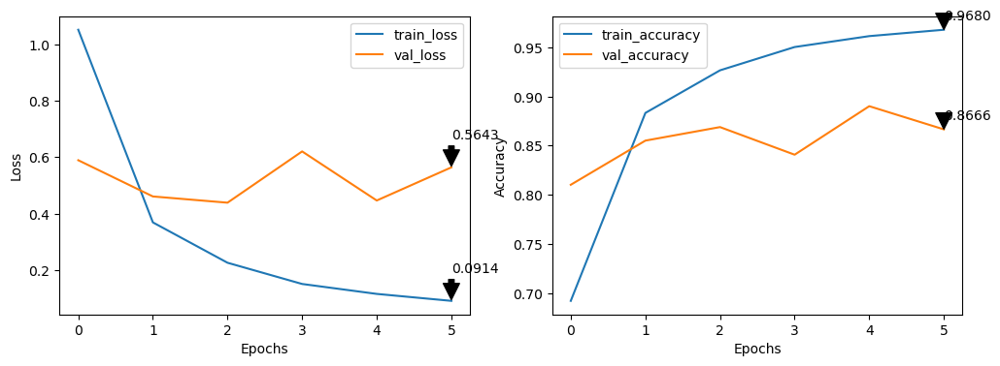

In [19]:
# figure out how many epochs there were
epochs = range(len(loss))
save="final_graph.jpg"
# setup a plot
plt.figure(figsize=(12, 4))
# plot loss
plt.subplot(1, 2, 1)
plt.plot(epochs, loss, label="train_loss")
plt.plot(epochs, val_loss, label="val_loss")
plt.ylabel("Loss")
plt.xlabel("Epochs")
plt.legend()
# Annotate the final points on the loss plot
plt.annotate(f'{loss[-1]:.4f}', xy=(epochs[-1], loss[-1]), xytext=(epochs[-1], loss[-1] + 0.1),
             arrowprops=dict(facecolor='black', shrink=0.05))
plt.annotate(f'{val_loss[-1]:.4f}', xy=(epochs[-1], val_loss[-1]), xytext=(epochs[-1], val_loss[-1] + 0.1),
             arrowprops=dict(facecolor='black', shrink=0.05))
# plot accuracy
plt.subplot(1, 2, 2)
plt.plot(epochs, acc, label="train_accuracy")
plt.plot(epochs, val_acc, label="val_accuracy")
plt.ylabel("Accuracy")
plt.xlabel("Epochs")
plt.legend()
# Annotate the final points on the accuracy plot
plt.annotate(f'{acc[-1]:.4f}', xy=(epochs[-1], acc[-1]), xytext=(epochs[-1], acc[-1] + 0.01),
             arrowprops=dict(facecolor='black', shrink=0.05))
plt.annotate(f'{val_acc[-1]:.4f}', xy=(epochs[-1], val_acc[-1]), xytext=(epochs[-1], val_acc[-1] + 0.01),
             arrowprops=dict(facecolor='black', shrink=0.05))
# save graph
plt.savefig(save)
# show graph
plt.show()

In [20]:
# Save the model
model.save('final_model.keras')

In [21]:
# load the trained model
new_model = tf.keras.models.load_model('final_model.keras')

# Show the model architecture
new_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 254, 254, 8)         │             224 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 127, 127, 8)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 125, 125, 16)        │           1,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 62, 62, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 60, 60, 32)          │           4,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 30, 30, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 28800)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │       3,686,528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 38)                  │           4,902 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,092,388 (42.31 MB)

 Trainable params: 3,697,462 (14.10 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,394,926 (28.21 MB)

In [22]:
# setup name-id mapping to display label for predictions
name_id_map = dict(zip(range(len(class_names)), class_names))
print(name_id_map)

{0: 'Apple___Apple_scab', 1: 'Apple___Black_rot', 2: 'Apple___Cedar_apple_rust', 3: 'Apple___healthy', 4: 'Blueberry___healthy', 5: 'Cherry_(including_sour)___Powdery_mildew', 6: 'Cherry_(including_sour)___healthy', 7: 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 8: 'Corn_(maize)___Common_rust_', 9: 'Corn_(maize)___Northern_Leaf_Blight', 10: 'Corn_(maize)___healthy', 11: 'Grape___Black_rot', 12: 'Grape___Esca_(Black_Measles)', 13: 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 14: 'Grape___healthy', 15: 'Orange___Haunglongbing_(Citrus_greening)', 16: 'Peach___Bacterial_spot', 17: 'Peach___healthy', 18: 'Pepper,_bell___Bacterial_spot', 19: 'Pepper,_bell___healthy', 20: 'Potato___Early_blight', 21: 'Potato___Late_blight', 22: 'Potato___healthy', 23: 'Raspberry___healthy', 24: 'Soybean___healthy', 25: 'Squash___Powdery_mildew', 26: 'Strawberry___Leaf_scorch', 27: 'Strawberry___healthy', 28: 'Tomato___Bacterial_spot', 29: 'Tomato___Early_blight', 30: 'Tomato___Late_blight', 31: 'To

In [23]:
# import testing data directory
test_data_dir = "..\\Project 4 Resources\\test"
jpg_test_files = list(Path(test_data_dir).rglob('*/*.jpg'))
len(jpg_test_files) #33

33

In [24]:
# get test images dataset
test_ds = tf.keras.utils.image_dataset_from_directory(
  test_data_dir,
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

test_dir = Path(os.path.join(test_data_dir, "test"))

Found 33 files belonging to 1 classes.


In [25]:
# create treatments_df to store and display treatments for diseases
treatments_df = pd.read_csv('plant_disease_treatments.csv')
treatments_df.insert(0, 'New_ID', range(0, 0 + len(treatments_df)))
treatments_df.head()

,New_ID,Plant Type,Disease,Treatment
0,0,Apple,Apple Scab,"For treating Apple Scab, apply fungicides such..."
1,1,Apple,Black Rot,"For treating Black Rot on apples, remove and d..."
2,2,Apple,cedar Apple rust,"For Cedar Apple Rust, remove nearby cedar tree..."
3,3,Apple,Healthy,Healthy plant. No treatment necessary!
4,4,Blueberry,Healthy,Healthy plant. No treatment necessary!


In [26]:
# test display treatment
treatments_df.loc[treatments_df.New_ID.eq(3), 'Treatment'].values[0]

'Healthy plant. No treatment necessary!'

In [27]:
# prediction function on single image
def predict_image(image_path, model):
    # open and preprocess the image
    img = tf.keras.utils.load_img(image_path, target_size=(img_height, img_width))
    img_array = tf.keras.utils.img_to_array(img)
    img_array = tf.expand_dims(img_array, 0) # Create a batch

    predictions = model.predict(img_array)
    im_class = tf.argmax(predictions[0], axis=-1)
    class_title = name_id_map.get(int(im_class))
    treatment = treatments_df.loc[treatments_df.New_ID.eq(int(im_class)), 'Treatment'].values[0]

    # display the image with prediction and confidence
    plt.imshow(np.squeeze(img_array.numpy().astype("uint8")))
    plt.title(f"Class Predicted: {class_title}")
    plt.axis("off")
    plt.show()
    
    print(treatment)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


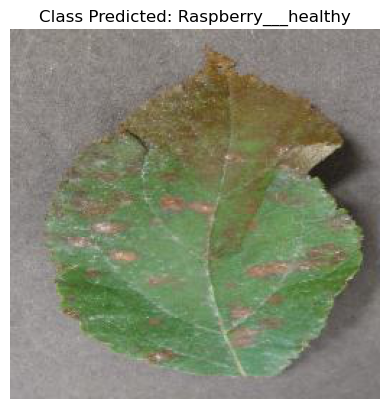

Healthy plant. No treatment necessary!


In [28]:
# Prediction Testing 1 Image at a Time
# apple cedar rust prediction
image_path = "../Project 4 Resources/test/test/AppleCedarRust4.JPG"
predict_image(image_path, new_model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


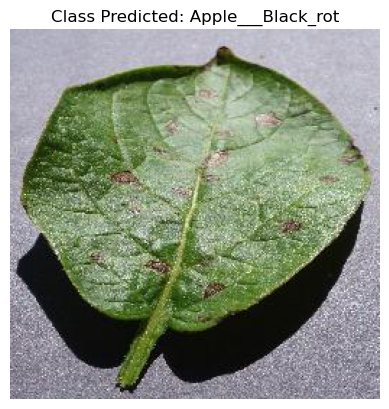

For treating Black Rot on apples, remove and destroy all infected fruits and branches to prevent further spread. Apply a fungicide like mancozeb or captan during the bloom period and continue at regular intervals as per the product's instructions.


In [29]:
# potato early blight prediction
image_path = "../Project 4 Resources/test/test/PotatoEarlyBlight5.JPG"
predict_image(image_path, new_model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


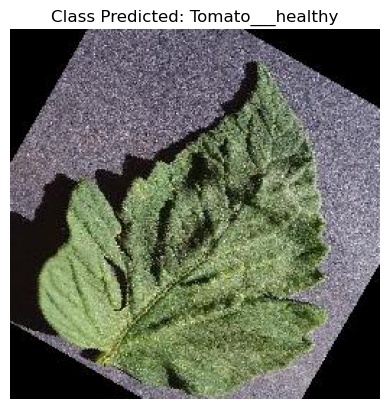

Healthy plant. No treatment necessary!


In [30]:
# healthy tomato prediction
image_path = "../Project 4 Resources/test/test/TomatoHealthy3.JPG"
predict_image(image_path, new_model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


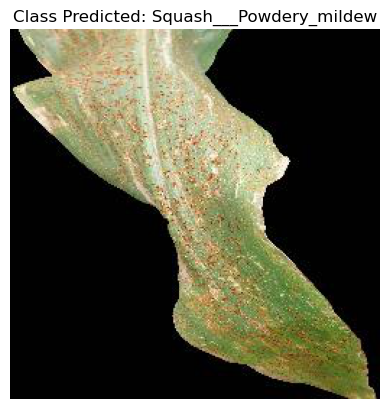

For Powdery Mildew on squash, apply a fungicide such as sulfur or a biological fungicide containing Bacillus subtilis. Additionally, ensure good air circulation by spacing plants properly and pruning any excess growth.


In [31]:
# corn common rust prediction
image_path = "../Project 4 Resources/test/test/CornCommonRust3.JPG"
predict_image(image_path, new_model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


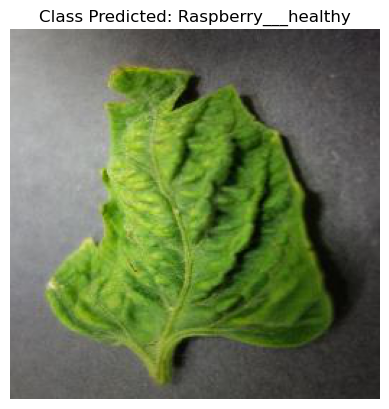

Healthy plant. No treatment necessary!


In [32]:
# tomato yellow curl virus prediction
image_path = "../Project 4 Resources/test/test/TomatoYellowCurlVirus4.JPG"
predict_image(image_path, new_model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


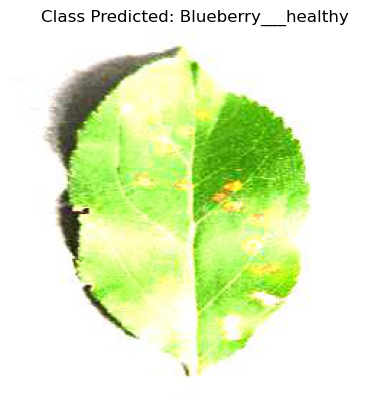

Healthy plant. No treatment necessary!
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


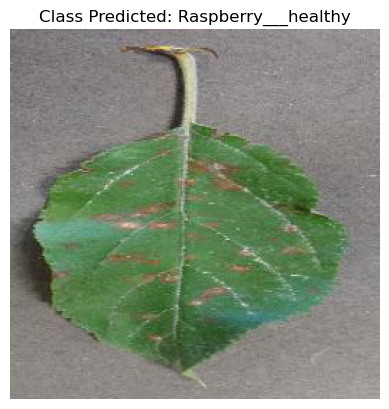

Healthy plant. No treatment necessary!
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


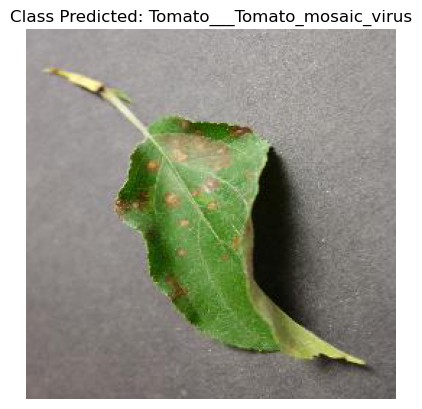

For managing Tomato Mosaic Virus, there is no cure once plants are infected. Prevent spread by using virus-free seeds, sterilizing tools and hands before handling plants, and removing and destroying infected plants. Also, rotate crops and avoid planting susceptible varieties in the same area for several years.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


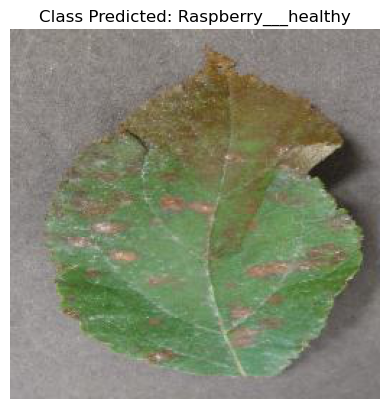

Healthy plant. No treatment necessary!
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


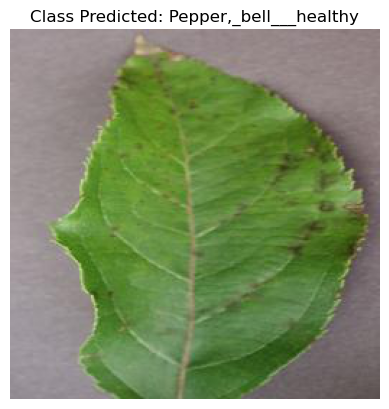

Healthy plant. No treatment necessary!
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


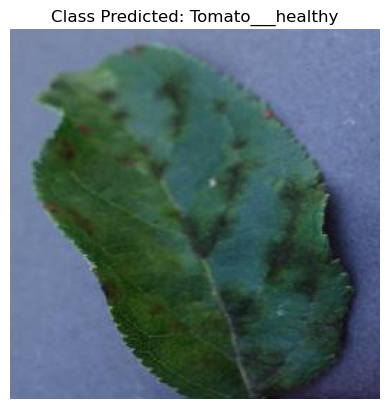

Healthy plant. No treatment necessary!
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


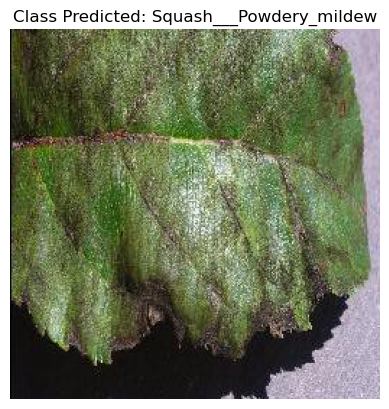

For Powdery Mildew on squash, apply a fungicide such as sulfur or a biological fungicide containing Bacillus subtilis. Additionally, ensure good air circulation by spacing plants properly and pruning any excess growth.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


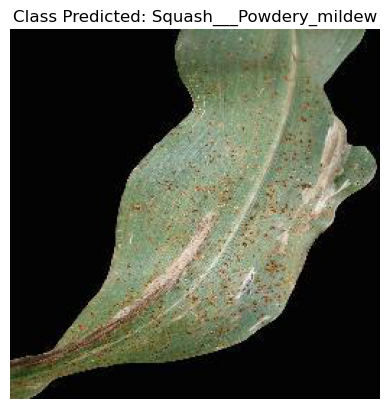

For Powdery Mildew on squash, apply a fungicide such as sulfur or a biological fungicide containing Bacillus subtilis. Additionally, ensure good air circulation by spacing plants properly and pruning any excess growth.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


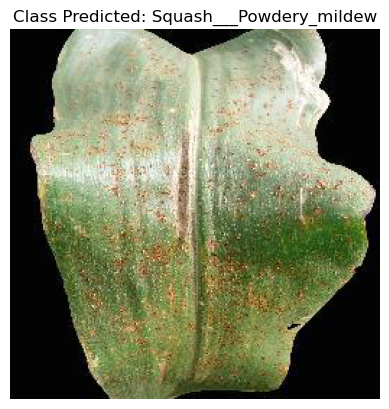

For Powdery Mildew on squash, apply a fungicide such as sulfur or a biological fungicide containing Bacillus subtilis. Additionally, ensure good air circulation by spacing plants properly and pruning any excess growth.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


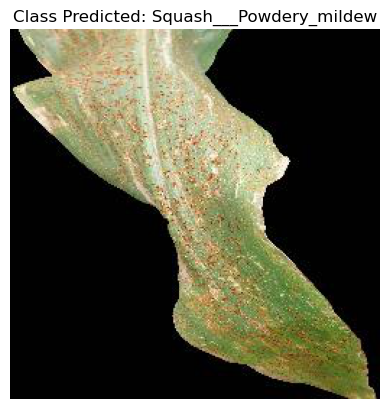

For Powdery Mildew on squash, apply a fungicide such as sulfur or a biological fungicide containing Bacillus subtilis. Additionally, ensure good air circulation by spacing plants properly and pruning any excess growth.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


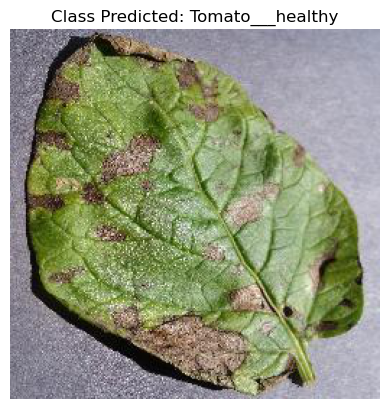

Healthy plant. No treatment necessary!
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


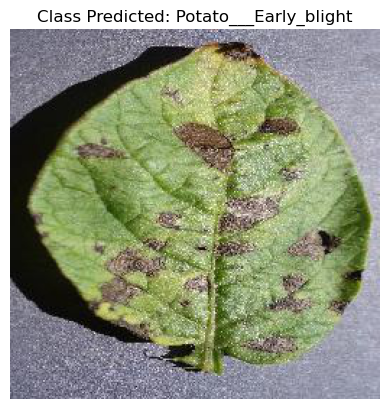

For Early Blight in potatoes, apply a fungicide that contains chlorothalonil or mancozeb as soon as symptoms are noticed and continue applications at regular intervals during the growing season. Improve air circulation and reduce leaf wetness by spacing plants properly and using drip irrigation instead of overhead watering.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


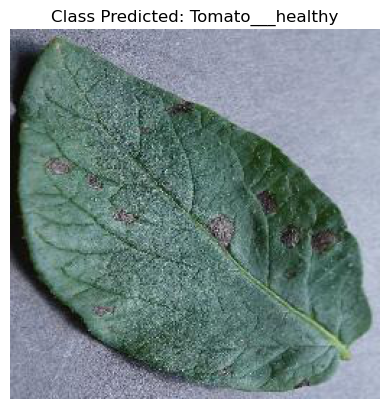

Healthy plant. No treatment necessary!
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


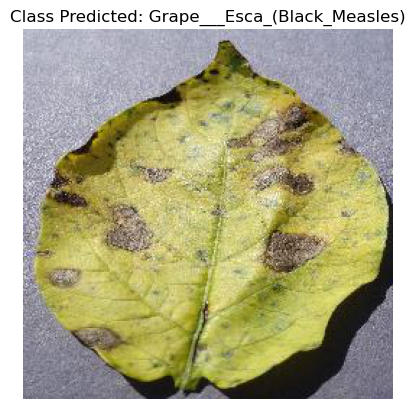

For Esca (Black Measles) in grapes, there is no effective chemical control once vines are infected. Focus on preventive measures like using disease-free planting material, applying wound protectants after pruning, and removing affected parts of the plant to reduce disease spread.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


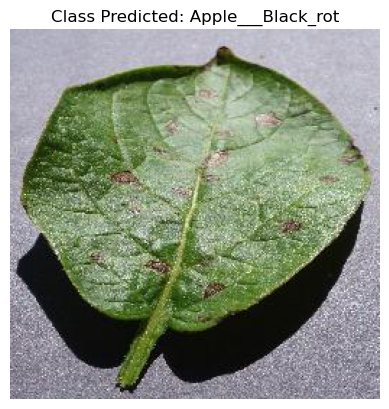

For treating Black Rot on apples, remove and destroy all infected fruits and branches to prevent further spread. Apply a fungicide like mancozeb or captan during the bloom period and continue at regular intervals as per the product's instructions.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


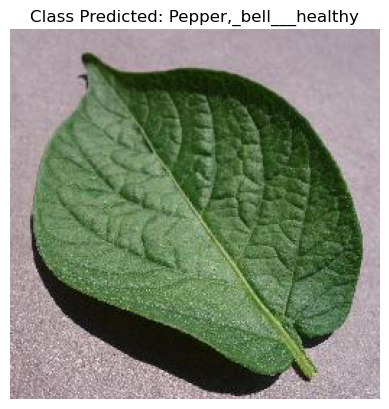

Healthy plant. No treatment necessary!
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


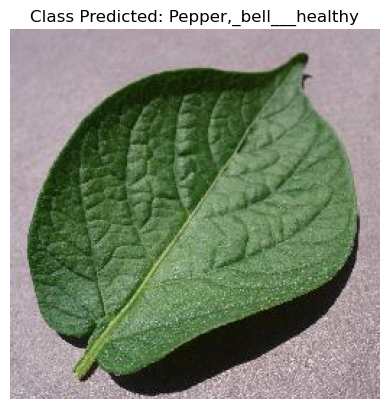

Healthy plant. No treatment necessary!
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


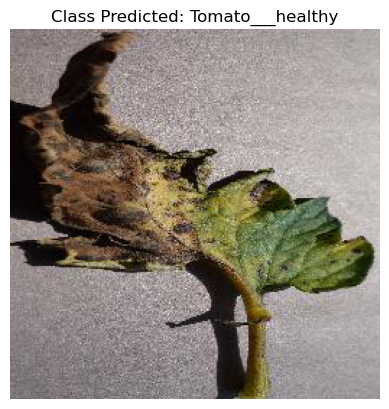

Healthy plant. No treatment necessary!
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


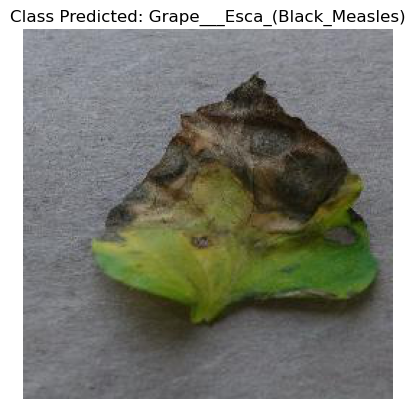

For Esca (Black Measles) in grapes, there is no effective chemical control once vines are infected. Focus on preventive measures like using disease-free planting material, applying wound protectants after pruning, and removing affected parts of the plant to reduce disease spread.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


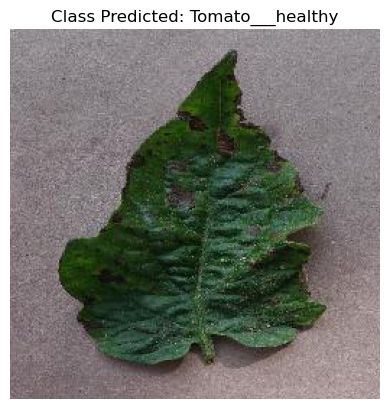

Healthy plant. No treatment necessary!
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


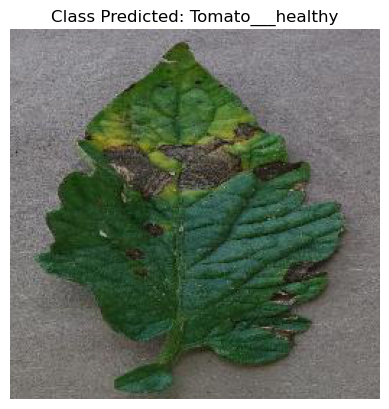

Healthy plant. No treatment necessary!
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


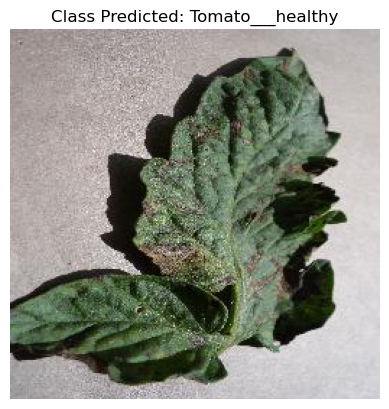

Healthy plant. No treatment necessary!
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


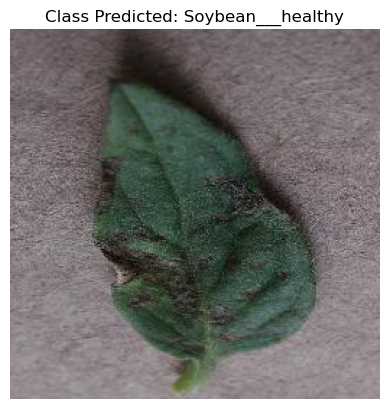

Healthy plant. No treatment necessary!
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


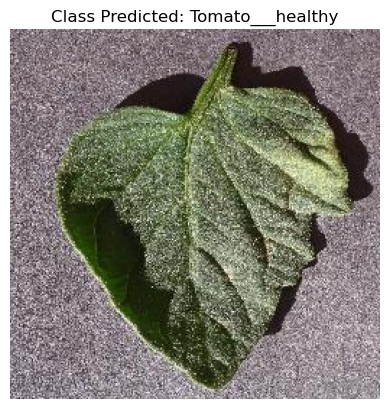

Healthy plant. No treatment necessary!
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


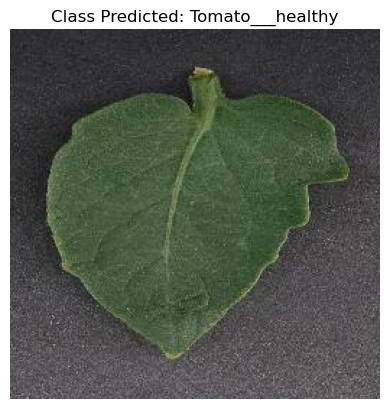

Healthy plant. No treatment necessary!
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


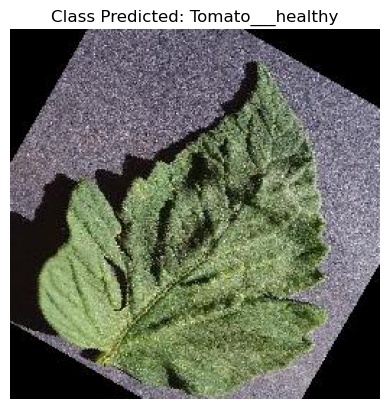

Healthy plant. No treatment necessary!
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


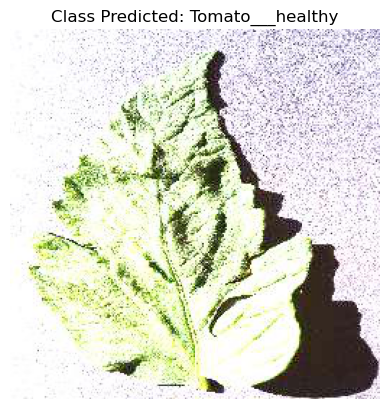

Healthy plant. No treatment necessary!
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


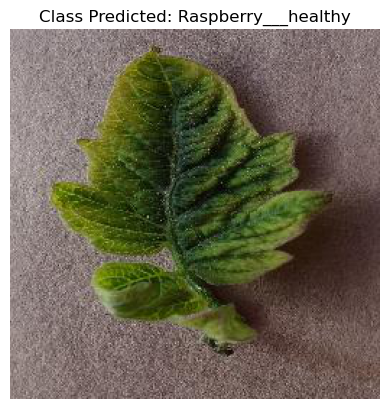

Healthy plant. No treatment necessary!
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


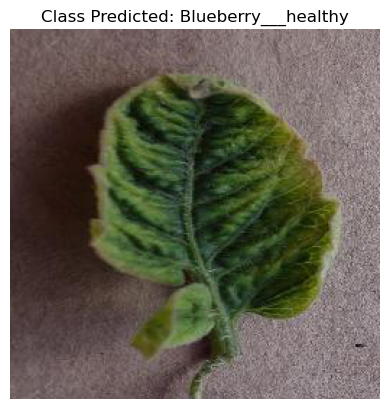

Healthy plant. No treatment necessary!
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


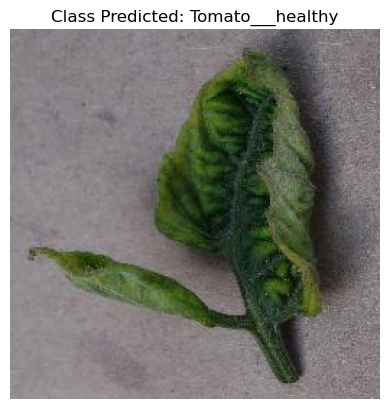

Healthy plant. No treatment necessary!
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


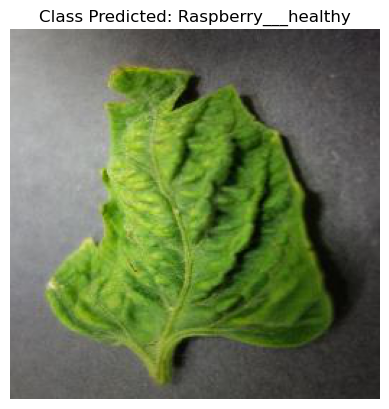

Healthy plant. No treatment necessary!
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


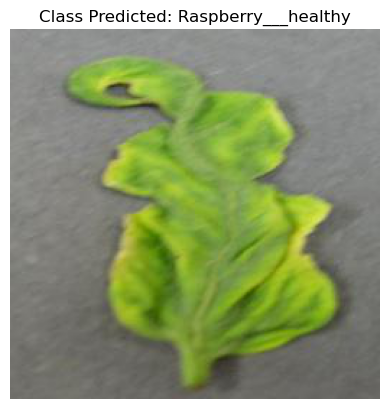

Healthy plant. No treatment necessary!
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


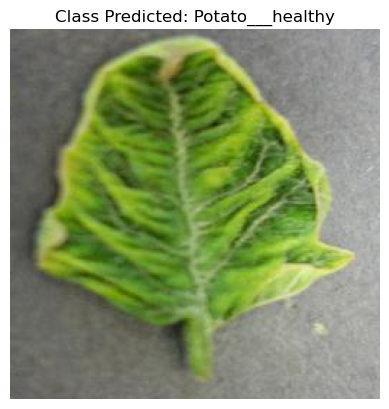

Healthy plant. No treatment necessary!


In [33]:
# testing data predictions
for images in os.listdir(test_dir):
        predict_image((str(test_dir) + "\\" + images), new_model)